In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import sklearn
import sklearn.preprocessing as preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
import optuna
from optuna.samplers import TPESampler
import catboost
import xgboost as xgb
import optuna.integration.lightgbm as lgb
from lightgbm import early_stopping
from lightgbm import log_evaluation
from imblearn.over_sampling import SMOTE
import warnings

In [57]:
warnings.simplefilter(action='ignore', category=FutureWarning)
train_raw = pd.read_csv('train.csv')

In [3]:
train_raw

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276_01,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,Gravior Noxnuther,False
8689,9278_01,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,Kurta Mondalley,False
8690,9279_01,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,Fayey Connon,True
8691,9280_01,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,Celeon Hontichre,False


In [85]:
train_raw[columns].dtypes

HomePlanet     object
CryoSleep      object
Cabin          object
Destination    object
VIP            object
dtype: object

In [4]:
profile = ProfileReport(train_raw, title='Profiling Report')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
train = train_raw.drop(columns=['PassengerId','Cabin','Name'])
train = train.fillna(train.median(numeric_only=True)).dropna()*1
train

,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,Europa,0,TRAPPIST-1e,39.0,0,0.0,0.0,0.0,0.0,0.0,0
1,Earth,0,TRAPPIST-1e,24.0,0,109.0,9.0,25.0,549.0,44.0,1
2,Europa,0,TRAPPIST-1e,58.0,1,43.0,3576.0,0.0,6715.0,49.0,0
3,Europa,0,TRAPPIST-1e,33.0,0,0.0,1283.0,371.0,3329.0,193.0,0
4,Earth,0,TRAPPIST-1e,16.0,0,303.0,70.0,151.0,565.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...
8688,Europa,0,55 Cancri e,41.0,1,0.0,6819.0,0.0,1643.0,74.0,0
8689,Earth,1,PSO J318.5-22,18.0,0,0.0,0.0,0.0,0.0,0.0,0
8690,Earth,0,TRAPPIST-1e,26.0,0,0.0,0.0,1872.0,1.0,0.0,1
8691,Europa,0,55 Cancri e,32.0,0,0.0,1049.0,0.0,353.0,3235.0,0


In [6]:
train.isna().sum()

HomePlanet      0
CryoSleep       0
Destination     0
Age             0
VIP             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
Transported     0
dtype: int64

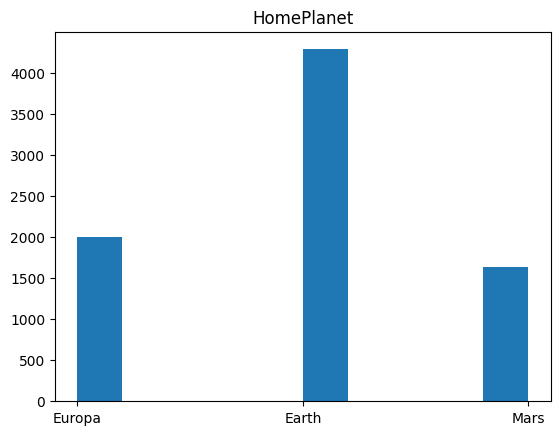

In [94]:
plt.figure()
plt.title('HomePlanet')
plt.hist(train['HomePlanet'])
plt.show()

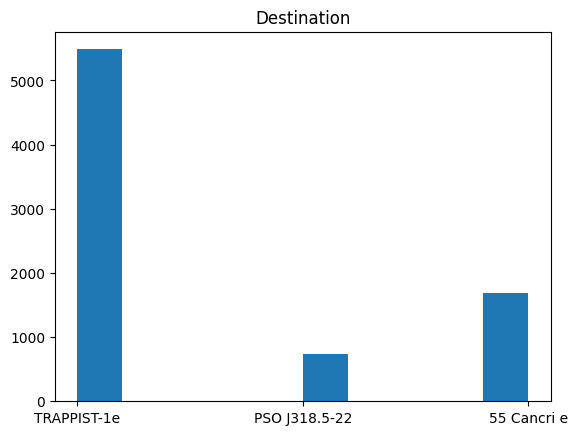

In [95]:
plt.figure()
plt.title('Destination')
plt.hist(train['Destination'])
plt.show()

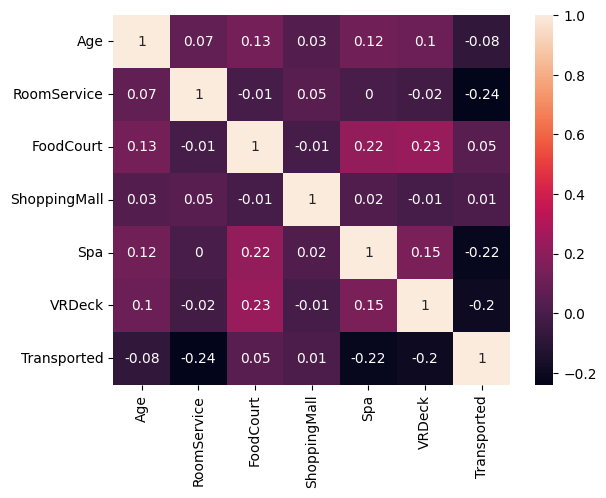

In [7]:
sns.heatmap(train.corr().round(2),annot=True)
plt.show()

In [8]:
ohe = make_column_transformer(
    (OneHotEncoder(), ['HomePlanet', 'Destination']))
train_ohe = pd.DataFrame(ohe.fit_transform(train), columns=ohe.get_feature_names_out())
train_ohe = train_ohe.join(train).drop(['HomePlanet', 'Destination'], axis=1)
train_ohe

,onehotencoder__HomePlanet_Earth,onehotencoder__HomePlanet_Europa,onehotencoder__HomePlanet_Mars,onehotencoder__Destination_55 Cancri e,onehotencoder__Destination_PSO J318.5-22,onehotencoder__Destination_TRAPPIST-1e,CryoSleep,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,0.0,1.0,0.0,0.0,0.0,1.0,0,39.0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,1.0,0,24.0,0,109.0,9.0,25.0,549.0,44.0,1.0
2,0.0,1.0,0.0,0.0,0.0,1.0,0,58.0,1,43.0,3576.0,0.0,6715.0,49.0,0.0
3,0.0,1.0,0.0,0.0,0.0,1.0,0,33.0,0,0.0,1283.0,371.0,3329.0,193.0,0.0
4,1.0,0.0,0.0,0.0,0.0,1.0,0,16.0,0,303.0,70.0,151.0,565.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7908,0.0,1.0,0.0,1.0,0.0,0.0,0,31.0,0,1997.0,0.0,0.0,0.0,0.0,0.0
7909,1.0,0.0,0.0,0.0,1.0,0.0,1,27.0,0,0.0,0.0,0.0,0.0,0.0,1.0
7910,1.0,0.0,0.0,0.0,0.0,1.0,0,52.0,1,0.0,831.0,1536.0,0.0,7953.0,0.0
7911,0.0,1.0,0.0,1.0,0.0,0.0,1,34.0,0,0.0,0.0,0.0,0.0,0.0,1.0


In [9]:
train_ohe = train_ohe.dropna()

In [10]:
train_ohe.isna().sum()

onehotencoder__HomePlanet_Earth             0
onehotencoder__HomePlanet_Europa            0
onehotencoder__HomePlanet_Mars              0
onehotencoder__Destination_55 Cancri e      0
onehotencoder__Destination_PSO J318.5-22    0
onehotencoder__Destination_TRAPPIST-1e      0
CryoSleep                                   0
Age                                         0
VIP                                         0
RoomService                                 0
FoodCourt                                   0
ShoppingMall                                0
Spa                                         0
VRDeck                                      0
Transported                                 0
dtype: int64

In [11]:
df = train_ohe
df

,onehotencoder__HomePlanet_Earth,onehotencoder__HomePlanet_Europa,onehotencoder__HomePlanet_Mars,onehotencoder__Destination_55 Cancri e,onehotencoder__Destination_PSO J318.5-22,onehotencoder__Destination_TRAPPIST-1e,CryoSleep,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,0.0,1.0,0.0,0.0,0.0,1.0,0,39.0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,1.0,0,24.0,0,109.0,9.0,25.0,549.0,44.0,1.0
2,0.0,1.0,0.0,0.0,0.0,1.0,0,58.0,1,43.0,3576.0,0.0,6715.0,49.0,0.0
3,0.0,1.0,0.0,0.0,0.0,1.0,0,33.0,0,0.0,1283.0,371.0,3329.0,193.0,0.0
4,1.0,0.0,0.0,0.0,0.0,1.0,0,16.0,0,303.0,70.0,151.0,565.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7908,0.0,1.0,0.0,1.0,0.0,0.0,0,31.0,0,1997.0,0.0,0.0,0.0,0.0,0.0
7909,1.0,0.0,0.0,0.0,1.0,0.0,1,27.0,0,0.0,0.0,0.0,0.0,0.0,1.0
7910,1.0,0.0,0.0,0.0,0.0,1.0,0,52.0,1,0.0,831.0,1536.0,0.0,7953.0,0.0
7911,0.0,1.0,0.0,1.0,0.0,0.0,1,34.0,0,0.0,0.0,0.0,0.0,0.0,1.0


In [12]:
df = df.drop_duplicates()
df

,onehotencoder__HomePlanet_Earth,onehotencoder__HomePlanet_Europa,onehotencoder__HomePlanet_Mars,onehotencoder__Destination_55 Cancri e,onehotencoder__Destination_PSO J318.5-22,onehotencoder__Destination_TRAPPIST-1e,CryoSleep,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,0.0,1.0,0.0,0.0,0.0,1.0,0,39.0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,1.0,0,24.0,0,109.0,9.0,25.0,549.0,44.0,1.0
2,0.0,1.0,0.0,0.0,0.0,1.0,0,58.0,1,43.0,3576.0,0.0,6715.0,49.0,0.0
3,0.0,1.0,0.0,0.0,0.0,1.0,0,33.0,0,0.0,1283.0,371.0,3329.0,193.0,0.0
4,1.0,0.0,0.0,0.0,0.0,1.0,0,16.0,0,303.0,70.0,151.0,565.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7904,1.0,0.0,0.0,0.0,0.0,1.0,0,25.0,0,1.0,0.0,1.0,14.0,1491.0,0.0
7906,0.0,1.0,0.0,0.0,0.0,1.0,0,32.0,0,0.0,2154.0,0.0,9655.0,859.0,0.0
7907,0.0,1.0,0.0,0.0,0.0,1.0,0,50.0,0,0.0,3070.0,0.0,44.0,562.0,1.0
7908,0.0,1.0,0.0,1.0,0.0,0.0,0,31.0,0,1997.0,0.0,0.0,0.0,0.0,0.0


In [13]:
profile = ProfileReport(df, title='Profiling Report')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
df_majority = df[df['VIP']==0]
df_minority = df[df['VIP']==1]

df_minority_upsampled = resample(df_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_majority),    # to match majority class
                                 random_state=1352222) # reproducible results
 
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

In [15]:
profile = ProfileReport(df_upsampled, title='Profiling Report')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
df_upsampled = df_upsampled.astype({'CryoSleep': 'int', 'VIP': 'int'})

In [17]:
y = df_upsampled['Transported']
X = df_upsampled.drop(columns=['Transported'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [18]:
X_test

,onehotencoder__HomePlanet_Earth,onehotencoder__HomePlanet_Europa,onehotencoder__HomePlanet_Mars,onehotencoder__Destination_55 Cancri e,onehotencoder__Destination_PSO J318.5-22,onehotencoder__Destination_TRAPPIST-1e,CryoSleep,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
7870,1.0,0.0,0.0,0.0,0.0,1.0,0,22.0,0,2.0,104.0,404.0,0.0,0.0
5958,1.0,0.0,0.0,0.0,0.0,1.0,0,65.0,0,458.0,0.0,555.0,0.0,0.0
879,1.0,0.0,0.0,0.0,0.0,1.0,0,13.0,0,0.0,7.0,0.0,1175.0,0.0
2334,1.0,0.0,0.0,1.0,0.0,0.0,0,28.0,1,2.0,2144.0,0.0,435.0,5872.0
4067,0.0,1.0,0.0,1.0,0.0,0.0,0,18.0,0,0.0,35.0,661.0,0.0,63.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,1.0,0.0,0.0,1.0,0.0,0.0,0,28.0,1,2.0,2144.0,0.0,435.0,5872.0
758,1.0,0.0,0.0,0.0,0.0,1.0,0,34.0,0,0.0,0.0,0.0,874.0,0.0
3204,1.0,0.0,0.0,0.0,0.0,1.0,0,42.0,0,1196.0,0.0,0.0,68.0,1.0
2586,1.0,0.0,0.0,0.0,0.0,1.0,0,23.0,0,0.0,0.0,0.0,757.0,0.0


In [19]:
#https://practicaldatascience.co.uk/machine-learning/how-to-tune-a-catboostclassifier-model-with-optuna
def objective_cat(trial):
    model = catboost.CatBoostClassifier(
        iterations=trial.suggest_int("iterations", 100, 1000),
        learning_rate=trial.suggest_float("learning_rate", 1e-3, 1e-1, log=True),
        depth=trial.suggest_int("depth", 4, 10),
        l2_leaf_reg=trial.suggest_float("l2_leaf_reg", 1e-8, 100.0, log=True),
        bootstrap_type=trial.suggest_categorical("bootstrap_type", ["Bayesian"]),
        random_strength=trial.suggest_float("random_strength", 1e-8, 10.0, log=True),
        bagging_temperature=trial.suggest_float("bagging_temperature", 0.0, 10.0),
        od_type=trial.suggest_categorical("od_type", ["IncToDec", "Iter"]),
        od_wait=trial.suggest_int("od_wait", 10, 50),
        verbose=False
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)

In [20]:
optuna.logging.set_verbosity(optuna.logging.WARNING)

sampler = TPESampler(seed=1352222)
study_cat = optuna.create_study(study_name="catboost", direction="maximize", sampler=sampler)
study_cat.optimize(objective_cat, n_trials=100)


In [21]:
print("Number of finished trials: ", len(study_cat.trials))
print("Best trial:")
trial = study_cat.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))


Number of finished trials:  100
Best trial:
  Value:  0.8808627182471757
  Params: 
    iterations: 853
    learning_rate: 0.025243046217626994
    depth: 4
    l2_leaf_reg: 0.00042460810760822977
    bootstrap_type: Bayesian
    random_strength: 0.41211541880784225
    bagging_temperature: 5.886740057152246
    od_type: IncToDec
    od_wait: 35


In [22]:
model_cat = catboost.CatBoostClassifier(**trial.params, verbose=False)
model_cat.fit(X_train, y_train)
y_pred_cat = model_cat.predict(X_test)
accuracy_cat = accuracy_score(y_test, y_pred_cat)

In [23]:
print(accuracy_cat)

0.8808627182471757


In [43]:
#hhttps://github.com/optuna/optuna-examples/blob/main/lightgbm/lightgbm_tuner_simple.py
dtrain = lgb.Dataset(X_train, label=y_train)
dtest = lgb.Dataset(X_test, label=y_test)
optuna.logging.set_verbosity(optuna.logging.ERROR)
params = {
    'objective': 'binary',
    'metric': 'binary_logloss',
    'verbosity': -1,
    'boosting_type': 'gbdt',
    'feature_pre_filter': False,
    'lambda_l1': 3.648159803890724e-07,
    'lambda_l2': 0.009426290242709832,
    'num_leaves': 43,
    'feature_fraction': 0.8,
    'bagging_fraction': 1.0,
    'bagging_freq': 0,
    'num_iterations': 1000,
    'min_data_in_leaf': 25,
    'min_child_samples': 20
    'early_stopping_round': None,
}

model_lgb = lgb.train(
    params,
    dtrain,
    valid_sets=[dtrain, dtest],
    callbacks=[early_stopping(200, verbose=0), log_evaluation(0)],
)
prediction = np.rint(model_lgb.predict(X_test, num_iteration=model_lgb.best_iteration))
accuracy_lgb = accuracy_score(y_test, prediction)

best_params = model_lgb.params
print("Best params:", best_params)
print("  Accuracy = {}".format(accuracy_lgb))
print("  Params: ")
for key, value in best_params.items():
    print("    {}: {}".format(key, value))

feature_fraction, val_score: inf:   0%|                                                                                                                                                                                                                         | 0/7 [00:00<?, ?it/s]/home/cezgru/.local/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=25


min_data_in_leaf, val_score: 0.256892: 100%|############################################################################################################################################################################################################| 5/5 [00:01<00:00,  2.68it/s]

Best params: {'objective': 'binary', 'metric': 'binary_logloss', 'verbosity': -1, 'boosting_type': 'gbdt', 'feature_pre_filter': False, 'lambda_l1': 3.648159803890724e-07, 'lambda_l2': 0.009426290242709832, 'num_leaves': 43, 'feature_fraction': 0.8, 'bagging_fraction': 1.0, 'bagging_freq': 0, 'min_data_in_leaf': 25, 'min_child_samples': 20, 'num_iterations': 1000, 'early_stopping_round': None}
  Accuracy = 0.8812050667579596
  Params: 
    objective: binary
    metric: binary_logloss
    verbosity: -1
    boosting_type: gbdt
    feature_pre_filter: False
    lambda_l1: 3.648159803890724e-07
    lambda_l2: 0.009426290242709832
    num_leaves: 43
    feature_fraction: 0.8
    bagging_fraction: 1.0
    bagging_freq: 0
    min_data_in_leaf: 25
    min_child_samples: 20
    num_iterations: 1000
    early_stopping_round: None


In [42]:
print(accuracy_lgb)

0.8812050667579596


In [76]:
#https://medium.com/optuna/using-optuna-to-optimize-xgboost-hyperparameters-63bfcdfd3407
def objective_xgb(trial):
    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_test, label=y_test)

    param = {
        "verbosity": 0,
        "objective": "binary:logistic",
        "eval_metric": "auc",
        "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
        "lambda": trial.suggest_loguniform("lambda", 1e-8, 1.0),
        "alpha": trial.suggest_loguniform("alpha", 1e-8, 1.0),
    }

    if param["booster"] == "gbtree" or param["booster"] == "dart":
        param["max_depth"] = trial.suggest_int("max_depth", 1, 9)
        param["eta"] = trial.suggest_loguniform("eta", 1e-8,1.0)
        param["gamma"] = trial.suggest_loguniform("gamma", 1e-8,1.0)
        param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])
    if param["booster"] == "dart":
        param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
        param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
        param["rate_drop"] = trial.suggest_loguniform("rate_drop", 1e-8, 1.0)
        param["skip_drop"] = trial.suggest_loguniform("skip_drop", 1e-8, 1.0)

    pruning_callback = optuna.integration.XGBoostPruningCallback(trial, "validation-auc")
    bst = xgb.train(param, dtrain, evals=[(dtest, "validation")], callbacks=[pruning_callback],verbose_eval=False)
    preds = bst.predict(dtest)
    pred_labels = np.rint(preds)
    accuracy = sklearn.metrics.accuracy_score(y_test, pred_labels)
    return accuracy

In [77]:
xgb.set_config(verbosity=0)
study_xgb = optuna.create_study(
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=5), direction="maximize"
)
study_xgb.optimize(objective_xgb, n_trials=100)
print(study_xgb.best_trial)

FrozenTrial(number=93, state=TrialState.COMPLETE, values=[0.8794933242040397], datetime_start=datetime.datetime(2023, 3, 25, 2, 34, 11, 265151), datetime_complete=datetime.datetime(2023, 3, 25, 2, 34, 11, 334346), params={'booster': 'gbtree', 'lambda': 7.338020300983679e-07, 'alpha': 3.778784500796099e-06, 'max_depth': 9, 'eta': 0.16813325936340778, 'gamma': 4.893974620434193e-08, 'grow_policy': 'depthwise'}, user_attrs={}, system_attrs={}, intermediate_values={0: 0.9296586286179921, 1: 0.9350194604311391, 2: 0.9412066695739588, 3: 0.9433879064834663, 4: 0.9449237040540347, 5: 0.9454859682204301, 6: 0.946175938267131, 7: 0.9461659572464258, 8: 0.9461337108718396, 9: 0.9467335958085855}, distributions={'booster': CategoricalDistribution(choices=('gbtree', 'gblinear', 'dart')), 'lambda': FloatDistribution(high=1.0, log=True, low=1e-08, step=None), 'alpha': FloatDistribution(high=1.0, log=True, low=1e-08, step=None), 'max_depth': IntDistribution(high=9, log=False, low=1, step=1), 'eta': F

In [78]:
study_xgb.best_trial.params

{'booster': 'gbtree',
 'lambda': 7.338020300983679e-07,
 'alpha': 3.778784500796099e-06,
 'max_depth': 9,
 'eta': 0.16813325936340778,
 'gamma': 4.893974620434193e-08,
 'grow_policy': 'depthwise'}

In [79]:
model_xgb = xgb.XGBClassifier(**study_xgb.best_trial.params, verbose=False)
model_xgb.fit(X_train, y_train)
y_pred_xgb = model_xgb.predict(X_test)
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
accuracy_xgb

0.8610065046217049

In [80]:
print(f'Accuracy\nCatboost: {accuracy_cat.round(5)}\nLightGBM: {accuracy_lgb.round(5)}\nXGBoost: {accuracy_xgb.round(5)}')

Accuracy
Catboost: 0.88086
LightGBM: 0.88121
XGBoost: 0.86101
